<a href="https://colab.research.google.com/github/andysingal/Optimization-deeplearning/blob/main/notebooks/Optimization2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import torch
import torch.nn as nn
import torch.nn.functional as F
import torchvision 
from torchvision import transforms

from torch.utils.data import Dataset, DataLoader

from tqdm.autonotebook import tqdm

import numpy as np
import seaborn as sns
import matplotlib.pyplot as plt
from matplotlib.pyplot import imshow

import pandas as pd

from sklearn.metrics import accuracy_score

import time

from idlmam import train_simple_network, Flatten, weight_reset, set_seed, run_epoch

<ipython-input-1-46d1804453b4>:9: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [2]:
%matplotlib inline
from IPython.display import set_matplotlib_formats
set_matplotlib_formats('png', 'pdf')

from IPython.display import display_pdf
from IPython.display import Latex


<ipython-input-2-024163930d81>:3: DeprecationWarning: `set_matplotlib_formats` is deprecated since IPython 7.23, directly use `matplotlib_inline.backend_inline.set_matplotlib_formats()`
  set_matplotlib_formats('png', 'pdf')


In [3]:
torch.backends.cudnn.deterministic=True
set_seed(45)

In [4]:
device = torch.device("cuda") if torch.cuda.is_available() else torch.device("cpu")

In [5]:
def train_network(model, loss_func, train_loader, val_loader=None, test_loader=None,score_funcs=None, 
                         epochs=50, device="cpu", checkpoint_file=None, 
                         lr_schedule=None, optimizer=None, disable_tqdm=False
                        ):
    """Train simple neural networks
    
    Keyword arguments:
    model -- the PyTorch model / "Module" to train
    loss_func -- the loss function that takes in batch in two arguments, the model outputs and the labels, and returns a score
    train_loader -- PyTorch DataLoader object that returns tuples of (input, label) pairs. 
    val_loader -- Optional PyTorch DataLoader to evaluate on after every epoch
    test_loader -- Optional PyTorch DataLoader to evaluate on after every epoch
    score_funcs -- A dictionary of scoring functions to use to evalue the performance of the model
    epochs -- the number of training epochs to perform
    device -- the compute lodation to perform training
    lr_schedule -- the learning rate schedule used to alter \eta as the model trains. If this is not None than the user must also provide the optimizer to use. 
    optimizer -- the method used to alter the gradients for learning. 
    
    """
    if score_funcs == None:
        score_funcs = {}#Empty set 
    
    to_track = ["epoch", "total time", "train loss"]
    if val_loader is not None:
        to_track.append("val loss")
    if test_loader is not None:
        to_track.append("test loss")
    for eval_score in score_funcs:
        to_track.append("train " + eval_score )
        if val_loader is not None:
            to_track.append("val " + eval_score )
        if test_loader is not None:
            to_track.append("test "+ eval_score )
        
    total_train_time = 0 #How long have we spent in the training loop? 
    results = {}
    #Initialize every item with an empty list
    for item in to_track:
        results[item] = []

    if optimizer == None:
        #The AdamW optimizer is a good default optimizer
        optimizer = torch.optim.AdamW(model.parameters())

    #Place the model on the correct compute resource (CPU or GPU)
    model.to(device)
    for epoch in tqdm(range(epochs), desc="Epoch", disable=disable_tqdm):
        model = model.train()#Put our model in training mode

        total_train_time += run_epoch(model, optimizer, train_loader, loss_func, device, results, score_funcs, prefix="train", desc="Training")
        
        results["epoch"].append( epoch )
        results["total time"].append( total_train_time )
        
      
        if val_loader is not None:
            model = model.eval() #Set the model to "evaluation" mode, b/c we don't want to make any updates!
            with torch.no_grad():
                run_epoch(model, optimizer, val_loader, loss_func, device, results, score_funcs, prefix="val", desc="Validating")
                
        #In PyTorch, the convention is to update the learning rate after every epoch
        if lr_schedule is not None:
            if isinstance(lr_schedule, torch.optim.lr_scheduler.ReduceLROnPlateau):
                lr_schedule.step(results["val loss"][-1])
            else:
                lr_schedule.step()
                
        if test_loader is not None:
            model = model.eval() #Set the model to "evaluation" mode, b/c we don't want to make any updates!
            with torch.no_grad():
                run_epoch(model, optimizer, test_loader, loss_func, device, results, score_funcs, prefix="test", desc="Testing")
        
        if checkpoint_file is not None:
            torch.save({
                'epoch': epoch,
                'model_state_dict': model.state_dict(),
                'optimizer_state_dict': optimizer.state_dict(),
                'results' : results
                }, checkpoint_file)

    return pd.DataFrame.from_dict(results)

# Making better use of gradients
We now know several ways to alter the learning rate η to improve how quickly our model learns and allow it to learn more accurate solutions. We did this by defining different learning rate schedules L(⋅,⋅), which look at the long term. Think of L(⋅,⋅) as setting the desired speed for the journey. But detours, potholes, and other obstacles in the short term may require a change in speed. This is why we also want to modify the gradient g with a function G(⋅). We focus on gradient update schemes on their own first and then combine them with learning rate schedules to get improved results. First, we talk about some broad motivations and then dive into the most common approaches. All three approaches are one-line changes to your code with PyTorch (they are built in) and can dramatically improve the accuracy of your models.


## Nesterov momentum: Adapting to changing consistency

A second flavor of momentum exists and is worth mentioning, as it often performs better in practice. This version is called Nesterov momentum.

In [6]:
#How many values are in the input? We use this to help determine the size of subsequent layers
D = 28*28 #28 * 28 images 
#Hidden layer size
n = 128 
#How many channels are in the input?
C = 1
#How many classes are there?
classes = 10

fc_model = nn.Sequential(
    nn.Flatten(),
    nn.Linear(D,  n),
    nn.Tanh(),
    nn.Linear(n,  n),
    nn.Tanh(),
    nn.Linear(n,  n),
    nn.Tanh(),
    nn.Linear(n, classes),
)

In [7]:
eta_0 = 0.1
loss_func = nn.CrossEntropyLoss()

epochs = 50 #50 epochs of training
B = 256 # a respectable average batch size
train_data = torchvision.datasets.FashionMNIST("./data", train=True, transform=transforms.ToTensor(), download=True)
test_data = torchvision.datasets.FashionMNIST("./data", train=False, transform=transforms.ToTensor(), download=True)

train_loader = DataLoader(train_data, batch_size=B, shuffle=True)
test_loader = DataLoader(test_data, batch_size=B)


fc_model.apply(weight_reset)

optimizer = torch.optim.SGD(fc_model.parameters(), lr=eta_0, momentum=0.9, nesterov=False)

fc_results_momentum = train_network(fc_model, loss_func, train_loader, test_loader=test_loader, epochs=epochs, optimizer=optimizer, score_funcs={'Accuracy': accuracy_score}, device=device)

100%|██████████| 26421880/26421880 [00:01<00:00, 18503378.55it/s]


Extracting ./data/FashionMNIST/raw/train-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 29515/29515 [00:00<00:00, 330098.56it/s]


Extracting ./data/FashionMNIST/raw/train-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 4422102/4422102 [00:00<00:00, 6072594.29it/s]


Extracting ./data/FashionMNIST/raw/t10k-images-idx3-ubyte.gz to ./data/FashionMNIST/raw



100%|██████████| 5148/5148 [00:00<00:00, 14472035.52it/s]


Extracting ./data/FashionMNIST/raw/t10k-labels-idx1-ubyte.gz to ./data/FashionMNIST/raw



Epoch:   0%|          | 0/50 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

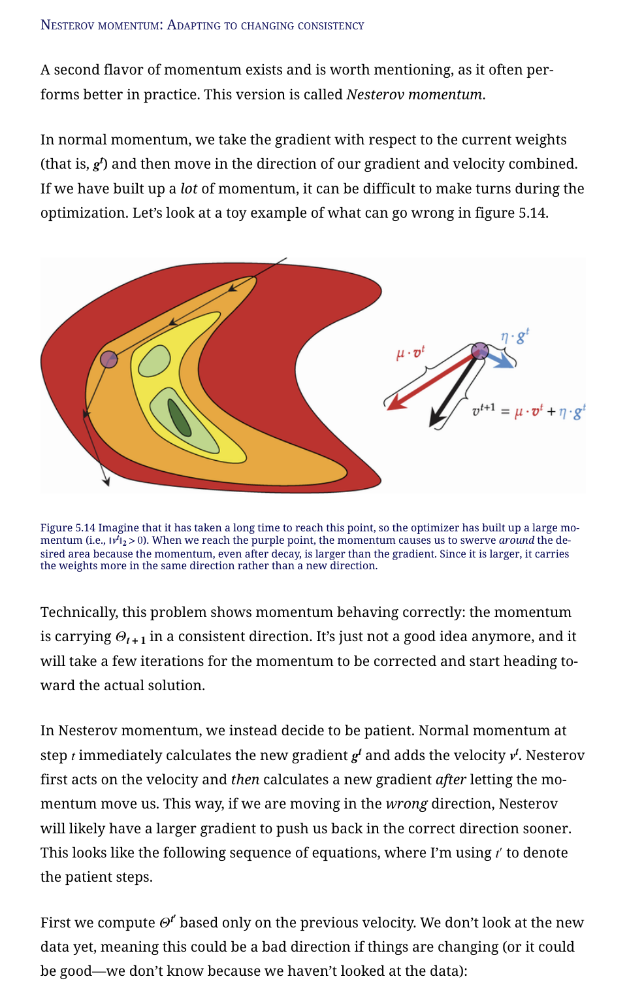

In [8]:
fc_model.apply(weight_reset)

optimizer = torch.optim.SGD(fc_model.parameters(), lr=eta_0, momentum=0.9, nesterov=True)

fc_results_nestrov = train_network(fc_model, loss_func, train_loader, test_loader=test_loader, epochs=epochs, optimizer=optimizer, score_funcs={'Accuracy': accuracy_score}, device=device)

Epoch:   0%|          | 0/50 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

<Axes: xlabel='epoch', ylabel='test Accuracy'>

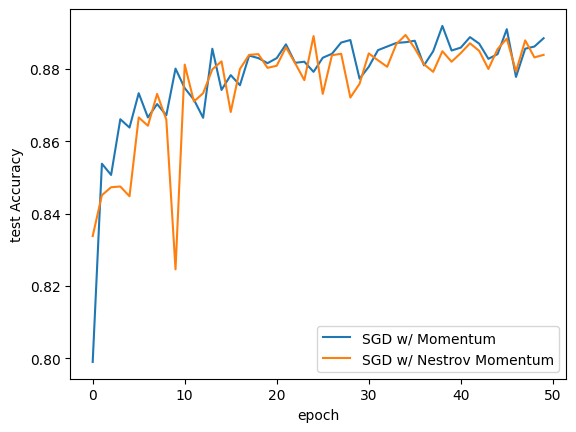

In [10]:
sns.lineplot(x='epoch', y='test Accuracy', data=fc_results_momentum, label='SGD w/ Momentum')
sns.lineplot(x='epoch', y='test Accuracy', data=fc_results_nestrov, label='SGD w/ Nestrov Momentum')


# Adam: Adding variance to momentum
One of the currently most popular optimization techniques is called adaptive moment estimation, or Adam for short. Adam is strongly related to the SGD with momentum that we just described. Adam is my current favorite approach because it has default parameters that just work, so I don’t have to spend time tuning them.

The original paper for the Adam algorithm contained a mistake, but the proposed algorithm still worked well for the vast majority of problems. A version that fixes this mistake is called AdamW and is the default we use in this book.

Another extension of Adam is NAdam, where the N stands for Nesterov. As you might guess, this version adapts Adam to use Nesterov momentum rather than standard momentum. A third flavor is AdaMax, which replaces some of the multiplication operations in Adam with max operations to improve the algorithm’s numerical stability. All of these flavors have pros and cons that are beyond the scope of this book, but any Adam variant will serve you well.

Now that we have learned about Adam, let’s try it. The following code again resets the weights for the neural network we have been training over and over, but using AdamW this time:

In [11]:
fc_model.apply(weight_reset)

#We don't set the learning rate for Adam because it's default is the one you should probably 
#always use, and it can be more sensitive to large changes in learning rate
optimizer = torch.optim.AdamW(fc_model.parameters())

fc_results_adam = train_network(fc_model, loss_func, train_loader, test_loader=test_loader, epochs=epochs, optimizer=optimizer, score_funcs={'Accuracy': accuracy_score}, device=device)

Epoch:   0%|          | 0/50 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

We can also combine these new optimizers with the learning rate schedules we have learned about. Here, we train Adam and SGD with Nesterov momentum combined with the cosine annealing schedule:

In [12]:
#Adam with Cosine Annealing
fc_model.apply(weight_reset)
optimizer = torch.optim.AdamW(fc_model.parameters())

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs//3)
fc_results_adam_coslr = train_network(fc_model, loss_func, train_loader, test_loader=test_loader, epochs=epochs, optimizer=optimizer, lr_schedule=scheduler, score_funcs={'Accuracy': accuracy_score}, device=device)

#SGD+Nestrov with Cosine Annealing 
fc_model.apply(weight_reset)
optimizer = torch.optim.SGD(fc_model.parameters(), lr=eta_0, momentum=0.9, nesterov=True)

scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs//3)
fc_results_nestrov_coslr = train_network(fc_model, loss_func, train_loader, test_loader=test_loader, epochs=epochs, optimizer=optimizer, lr_schedule=scheduler, score_funcs={'Accuracy': accuracy_score}, device=device)

Epoch:   0%|          | 0/50 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Epoch:   0%|          | 0/50 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

❶ Adam with cosine annealing

❶ SGD+Nesterov with cosine annealing

# Gradient clipping: Avoiding exploding gradients
We have one last trick to talk about, which is compatible with both optimizers like Adam and SGD as well as learning rate schedules. It is called gradient clipping, and it helps us solve the exploding gradient problem. Unlike all the mathematical intuition and logic that went into everything we have discussed so far, gradient clipping is refreshingly simple: if any (absolute) value in a gradient is larger than some threshold z, just set it to a maximum value of z. 

In [18]:
fc_model.apply(weight_reset)

for p in fc_model.parameters(): 
      p.register_hook(lambda grad: torch.clamp(grad, -5, 5)) 

optimizer = torch.optim.AdamW(fc_model.parameters()) 
scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs//3) 
fc_results_nesterov_coslr_clamp = train_network(fc_model, loss_func, train_loader, test_loader=test_loader, epochs=epochs, optimizer=optimizer, lr_schedule=scheduler, 
score_funcs={'Accuracy': accuracy_score}, device=device)

Epoch:   0%|          | 0/50 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

Training:   0%|          | 0/235 [00:00<?, ?it/s]

Testing:   0%|          | 0/40 [00:00<?, ?it/s]

<Axes: xlabel='epoch', ylabel='test Accuracy'>

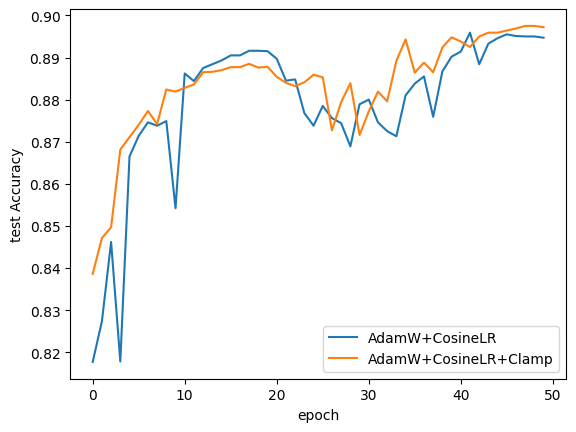

In [19]:
sns.lineplot(x='epoch', y='test Accuracy', data=fc_results_nestrov_coslr, label='AdamW+CosineLR')
sns.lineplot(x='epoch', y='test Accuracy', data=fc_results_nesterov_coslr_clamp, label='AdamW+CosineLR+Clamp')

 If I’m working with recurrent neural networks, I always use gradient clipping because the recurrent connections tend to cause exploding gradients, making them a common issue in that scenario. But if you want to always include clipping, doing so is an equally valid strategy. Using a clip value of z = 5 or z = 10 is common and works well for most problems.

# Hyperparameter optimization with Optuna

Now that we have improved how to do training, we will reuse many of these techniques throughout the book because they are useful for any and every neural network you will ever train. The improvements so far have focused on optimizing when we have gradients. But hyperparameters are things we would like to optimize for which we do not have any gradients, such as the initial learning rate η to use and the value of the momentum term μ. We would also like to optimize the architecture of our networks: should we use two layers or three? How about the number of neurons in each hidden layer?

The first hyperparameter tuning method most people learn in machine learning is called grid search. While valuable, grid search works well only for optimizing one or two variables at a time due to its exponential cost as more variables are added. When training a neural network, we usually have at least three parameters we want to optimize (number of layers, number of neurons in each layer, and learning rate η). We instead use a newer approach—Optuna—to tuning hyperparameters, which works much better. Unlike grid search, it requires fewer decisions, finds better parameter values, can handle more hyperparameters, and can be adapted to your computational budget

In [20]:
!pip install optuna

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 365.7/365.7 kB 16.2 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 23.6 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 78.7/78.7 kB 8.7 MB/s eta 0:00:00


To perform a smarter type of hyperparameter optimization, we use a library called Optuna. Optuna can be used with any framework, as long as you can describe the goal as a single numeric value. Luckily for us, we have the accuracy or error as our goal, so we can use Optuna. Optuna does a better job of hyperparameter optimization by using a Bayesian technique to model the hyperparameter problem as its own machine learning task. We could spend a whole chapter (or more) on the technical details of how Optuna works: in short, it trains its own machine learning algorithm to predict a model’s accuracy (the label) based on its hyperparameters (the features). Optuna then sequentially tries new models based on what it predicts to be good hyperparameters, trains the model to find out how well it did, adds that information to improve the model, and then selects a new guess. But for now, let’s focus on how to use Optuna as a tool.

To start, let’s see a little about how Optuna works. Similar to PyTorch, it has a “define by run” concept. For Optuna, we define a function that we want to minimize (or maximize), which takes as input a trial object. This trial object is used to get guesses for each parameter we want to tune and returns a score at the end.

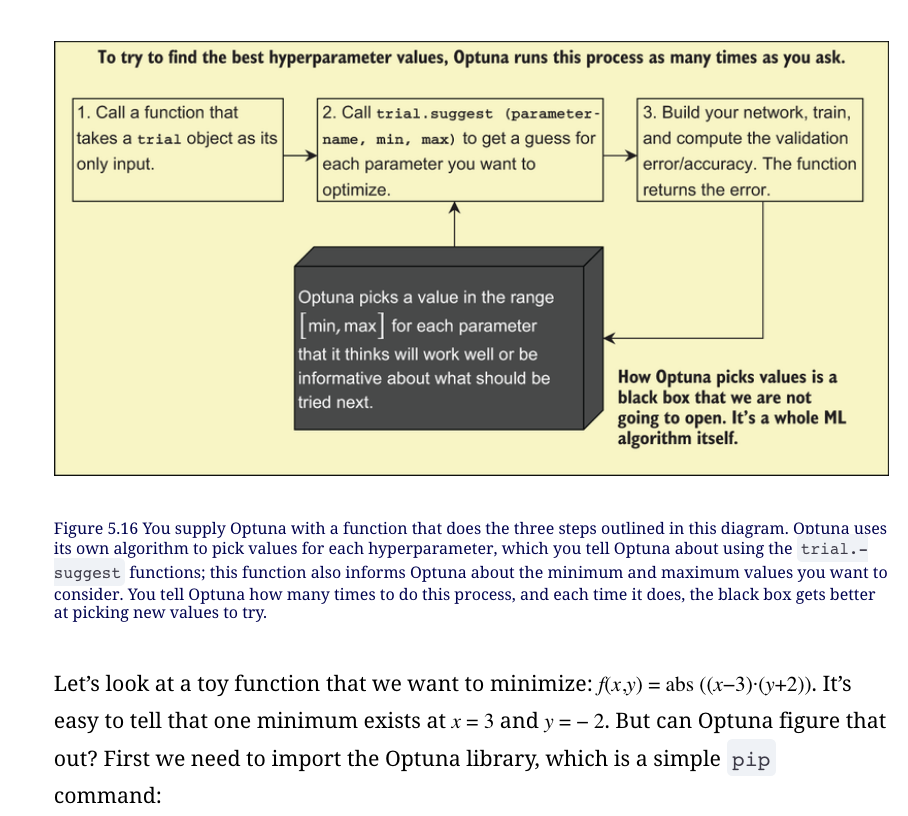

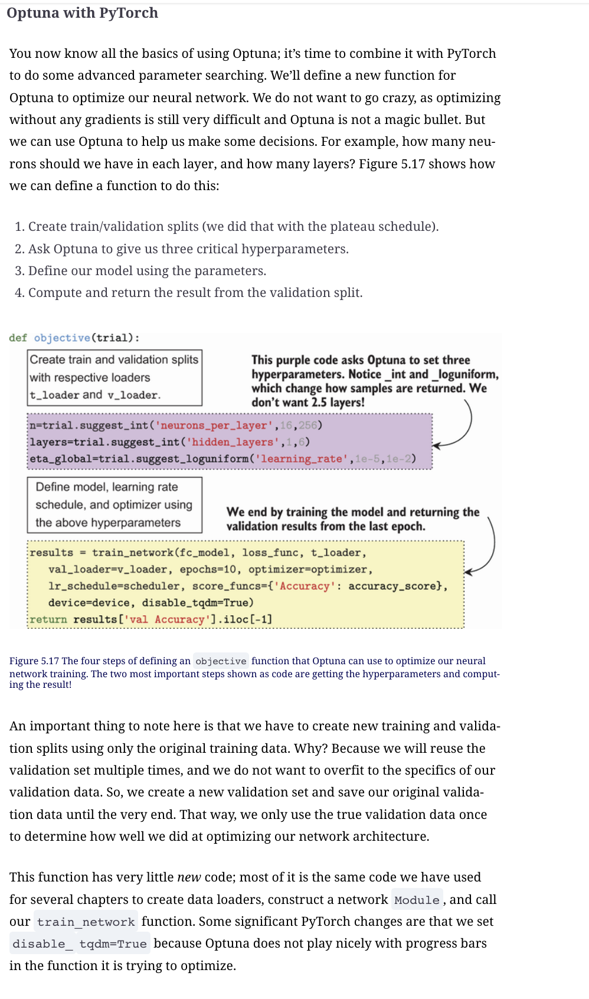

In [21]:
import optuna #Now we can import optuna

def toyFunc(trial):
    #The below two calls ask optuna for two parameters, and definethe minimum and maximum value for each one. 
    x = trial.suggest_uniform('x', -10.0, 10.0) #$x \sim \mathcal{U}(-10,10)$
    y = trial.suggest_uniform('y', -10.0, 10.0) #$y \sim \mathcal{U}(-10,10)$
    #Now we can compute and return the result. Optuna will try to minimize this value
    return abs((x-3)*(y+2)) #|(x-3)\cdot(y+2)|

study = optuna.create_study(direction='minimize') #If you said direction='maximize' Optuna would try and maximize the value returned by toyFunc
study.optimize(toyFunc, n_trials=100) #We tell Optuna which function to minimize, and that it gets 100 attempts

print(study.best_params) #This dictionary holds the parameter values Optuna found best

fig = optuna.visualization.plot_contour(study)

[I 2023-05-26 03:58:18,385] A new study created in memory with name: no-name-6413abc5-1daa-4008-a675-b944b259b5a6
<ipython-input-21-63222df5b458>:5: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  x = trial.suggest_uniform('x', -10.0, 10.0) #$x \sim \mathcal{U}(-10,10)$
<ipython-input-21-63222df5b458>:6: FutureWarning: suggest_uniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.
  y = trial.suggest_uniform('y', -10.0, 10.0) #$y \sim \mathcal{U}(-10,10)$
[I 2023-05-26 03:58:18,396] Trial 0 finished with value: 14.1342236253629 and parameters: {'x': 1.5643782547345353, 'y': 7.845367466727318}. Best is trial 0 with value: 14.1342236253629.
[I 2023-05-26 03:58:18,401] Trial 1 finished wi

{'x': 3.0948859308225565, 'y': -2.009815967870754}


In [22]:
def objective(trial):
    
    train_subset = int(len(train_data)*0.8)
    test_subset = len(train_data)-train_subset
    
    split = torch.utils.data.random_split(train_data, [train_subset, test_subset])
    
    t_loader = DataLoader(split[0], batch_size=B, shuffle=True)
    v_loader = DataLoader(split[1], batch_size=B, shuffle=False)

    #Hidden layer size
    n = trial.suggest_int('neurons_per_layer', 16, 256) 
    layers = trial.suggest_int('hidden_layers', 1, 6) 
    #How many channels are in the input?
    C = 1
    #How many classes are there?
    classes = 10

    #At least one hidden layer, that take in D inputs
    sequential_layers = [
        nn.Flatten(),
        nn.Linear(D,  n),
        nn.Tanh(),
    ]
    #Now lets add in a variable number of hidden layers, depending on what Optuna gave us for the "layers" parameter
    for _ in range(layers-1):
        sequential_layers.append( nn.Linear(n,  n) )
        sequential_layers.append( nn.Tanh() )
    
    #Output layer
    sequential_layers.append( nn.Linear(n, classes) )
    
    #Now turn the list of layers into a PyTorch Sequential Module 
    fc_model = nn.Sequential(*sequential_layers)
    #What should our global learning rate be? Notice that we can ask for new hyper-parameters from optuna whenever we want.
    eta_global = trial.suggest_loguniform('learning_rate', 1e-5, 1e-2)

    
    optimizer = torch.optim.AdamW(fc_model.parameters(), lr=eta_global)

    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs//3)
    results = train_network(fc_model, loss_func, t_loader, test_loader=v_loader,
                                     epochs=10, optimizer=optimizer, lr_schedule=scheduler,
                                     score_funcs={'Accuracy': accuracy_score}, device=device, 
                                     disable_tqdm=True)

    return results['test Accuracy'].iloc[-1]  # A objective value linked with the Trial object.

In [23]:
study = optuna.create_study(direction='maximize')
study.optimize(objective, n_trials=10) #Normally we would do more like 50-100 trials,
#but we are doing less to make sure this notebook runs in a reasonable amount of time

[I 2023-05-26 03:59:09,440] A new study created in memory with name: no-name-023b73ce-3e48-4eb9-83ab-ff8e691d1496
<ipython-input-22-85b1f9f53c8b>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 04:01:38,958] Trial 0 finished with value: 0.8733333333333333 and parameters: {'neurons_per_layer': 99, 'hidden_layers': 6, 'learning_rate': 0.0005089469030300773}. Best is trial 0 with value: 0.8733333333333333.
<ipython-input-22-85b1f9f53c8b>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 04:03:47,982] Trial 1 finished with value: 0.8855833333333333 and parameters: {'neurons_per_layer': 107, 'hidden_layers': 4, 'learning_rate': 0.0026585485010759647}. Best is trial 1 with value: 0.8855833333333333.
<ipython-input-22-85b1f9f53c8b>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 04:05:59,270] Trial 2 finished with value: 0.856 and parameters: {'neurons_per_layer': 118, 'hidden_layers': 2, 'learning_rate': 0.0001833415188940454}. Best is trial 1 with value: 0.8855833333333333.
<ipython-input-22-85b1f9f53c8b>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 04:08:09,596] Trial 3 finished with value: 0.7758333333333334 and parameters: {'neurons_per_layer': 229, 'hidden_layers': 1, 'learning_rate': 2.111255158618565e-05}. Best is trial 1 with value: 0.8855833333333333.
<ipython-input-22-85b1f9f53c8b>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 04:10:24,385] Trial 4 finished with value: 0.8900833333333333 and parameters: {'neurons_per_layer': 175, 'hidden_layers': 2, 'learning_rate': 0.0023535323165787925}. Best is trial 4 with value: 0.8900833333333333.
<ipython-input-22-85b1f9f53c8b>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 04:12:46,215] Trial 5 finished with value: 0.8306666666666667 and parameters: {'neurons_per_layer': 254, 'hidden_layers': 2, 'learning_rate': 4.270391441167004e-05}. Best is trial 4 with value: 0.8900833333333333.
<ipython-input-22-85b1f9f53c8b>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 04:15:19,341] Trial 6 finished with value: 0.8740833333333333 and parameters: {'neurons_per_layer': 185, 'hidden_layers': 6, 'learning_rate': 0.005904071468078818}. Best is trial 4 with value: 0.8900833333333333.
<ipython-input-22-85b1f9f53c8b>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 04:17:24,626] Trial 7 finished with value: 0.8736666666666667 and parameters: {'neurons_per_layer': 32, 'hidden_layers': 4, 'learning_rate': 0.0005902228966656707}. Best is trial 4 with value: 0.8900833333333333.
<ipython-input-22-85b1f9f53c8b>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 04:19:53,321] Trial 8 finished with value: 0.86825 and parameters: {'neurons_per_layer': 156, 'hidden_layers': 6, 'learning_rate': 0.0004768384189393494}. Best is trial 4 with value: 0.8900833333333333.
<ipython-input-22-85b1f9f53c8b>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Testing:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 04:22:03,320] Trial 9 finished with value: 0.8296666666666667 and parameters: {'neurons_per_layer': 75, 'hidden_layers': 2, 'learning_rate': 8.783179596249725e-05}. Best is trial 4 with value: 0.8900833333333333.


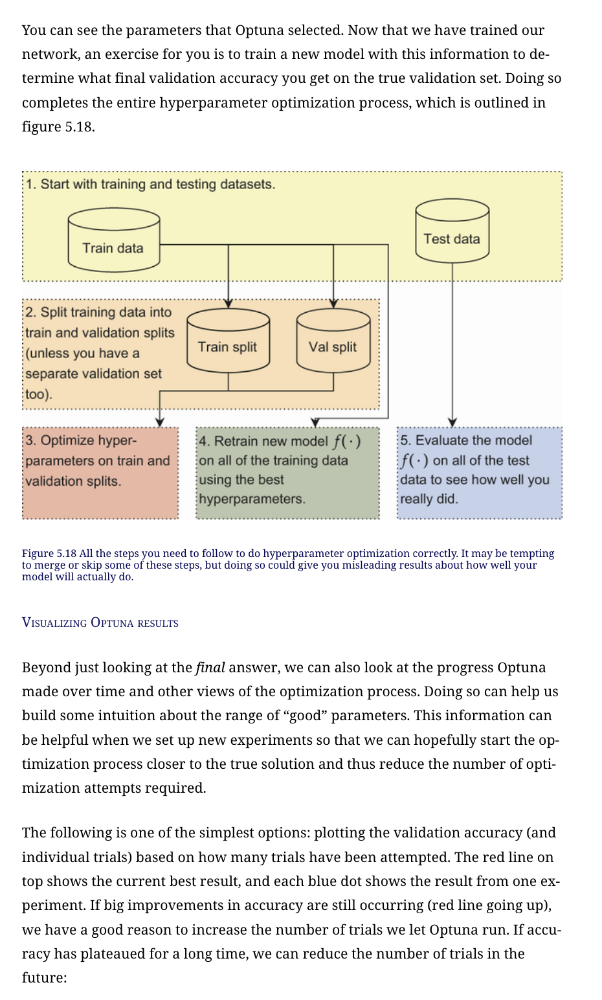

In [24]:
print(study.best_params) 



{'neurons_per_layer': 175, 'hidden_layers': 2, 'learning_rate': 0.0023535323165787925}


In [25]:
fig = optuna.visualization.plot_optimization_history(study)
fig.show()

In [26]:
fig = optuna.visualization.plot_slice(study) 
fig.show()

In [27]:
fig = optuna.visualization.plot_contour(study, params=['neurons_per_layer', 'hidden_layers', "learning_rate"])
fig.show()

# Pruning trials with Optuna
Another feature that Optuna supports that is particularly useful when training neural networks is pruning trials early. The idea is that optimizing a neural network is iterative: we take multiple epochs through the dataset, and we (hopefully) improve with every epoch. This is valuable information we are not using. If we can determine early in the process that a model won’t pan out, we can save a lot of time.

Say we start testing a set of parameters, and learning fails from the start, with terrible results on the first few epochs. Why continue training until the end? The model is very unlikely to start as degenerate and later become one of the best performers. If we report intermediate results to Optuna, Optuna can prune out trials that look bad based on the trials that have already completed.

We can accomplish this by replacing the last two lines of code from thedef objective(trial): function. Instead of calling train_network once with 10 epochs, we call it 10 times in a loop for 1 epoch each. After each epoch, we use the report function of the trial object to let Optuna know how we are currently doing and ask Optuna if we should stop. The revised code looks like this:

In [28]:
def objectivePrunable(trial):
    
    train_subset = int(len(train_data)*0.8)
    test_subset = len(train_data)-train_subset
    
    split = torch.utils.data.random_split(train_data, [train_subset, test_subset])
    
    t_loader = DataLoader(split[0], batch_size=B, shuffle=True)
    v_loader = DataLoader(split[1], batch_size=B, shuffle=False)

    #Hidden layer size
    n = trial.suggest_int('neurons_per_layer', 1, 256) 
    layers = trial.suggest_int('hidden_layers', 1, 6) 
    #How many channels are in the input?
    C = 1
    #How many classes are there?
    classes = 10

    #At least one hidden layer, that take in D inputs
    sequential_layers = [
        Flatten(),
        nn.Linear(D,  n),
        nn.Tanh(),
    ]
    
    for _ in range(layers-1):
        sequential_layers.append( nn.Linear(n,  n) )
        sequential_layers.append( nn.Tanh() )
    
    #Output layer
    sequential_layers.append( nn.Linear(n, classes) )
    

    fc_model = nn.Sequential(*sequential_layers)
    
    eta_global = trial.suggest_loguniform('learning_rate', 1e-6, 1e+2)

    #We need to create the optimizer (and any learning rate schedule) outside of the train_network call so that the same optimizer is re-used between epochs
    optimizer = torch.optim.AdamW(fc_model.parameters(), lr=eta_global)
    scheduler = torch.optim.lr_scheduler.CosineAnnealingLR(optimizer, epochs//3)
    
    for epoch in range(10):
    
        results = train_network(fc_model, loss_func, t_loader, val_loader=v_loader,
                                         epochs=1, optimizer=optimizer, lr_schedule=scheduler,
                                         score_funcs={'Accuracy': accuracy_score}, device=device, 
                                         disable_tqdm=True)
        cur_accuracy = results['val Accuracy'].iloc[-1]
        trial.report(cur_accuracy, epoch)
        
        if trial.should_prune():
            raise optuna.exceptions.TrialPruned()

    return cur_accuracy

In [29]:
study2 = optuna.create_study(direction='maximize')
study2.optimize(objectivePrunable, n_trials=20)

[I 2023-05-26 04:29:31,842] A new study created in memory with name: no-name-17b9a7b9-7523-43cd-b0a1-b3324067f001
<ipython-input-28-9282c535f83d>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 04:31:43,660] Trial 0 finished with value: 0.09916666666666667 and parameters: {'neurons_per_layer': 17, 'hidden_layers': 2, 'learning_rate': 22.514124881625506}. Best is trial 0 with value: 0.09916666666666667.
<ipython-input-28-9282c535f83d>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 04:33:50,282] Trial 1 finished with value: 0.09741666666666667 and parameters: {'neurons_per_layer': 60, 'hidden_layers': 6, 'learning_rate': 0.27891209316545407}. Best is trial 0 with value: 0.09916666666666667.
<ipython-input-28-9282c535f83d>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 04:36:03,514] Trial 2 finished with value: 0.09741666666666667 and parameters: {'neurons_per_layer': 102, 'hidden_layers': 6, 'learning_rate': 1.7011476765052194}. Best is trial 0 with value: 0.09916666666666667.
<ipython-input-28-9282c535f83d>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 04:38:05,975] Trial 3 finished with value: 0.86775 and parameters: {'neurons_per_layer': 18, 'hidden_layers': 5, 'learning_rate': 0.0012345993107746355}. Best is trial 3 with value: 0.86775.
<ipython-input-28-9282c535f83d>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 04:40:08,985] Trial 4 finished with value: 0.35941666666666666 and parameters: {'neurons_per_layer': 38, 'hidden_layers': 3, 'learning_rate': 4.211430863021782e-06}. Best is trial 3 with value: 0.86775.
<ipython-input-28-9282c535f83d>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 04:42:29,459] Trial 5 finished with value: 0.8203333333333334 and parameters: {'neurons_per_layer': 236, 'hidden_layers': 2, 'learning_rate': 0.021388102071198678}. Best is trial 3 with value: 0.86775.
<ipython-input-28-9282c535f83d>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 04:44:46,513] Trial 6 finished with value: 0.8226666666666667 and parameters: {'neurons_per_layer': 125, 'hidden_layers': 4, 'learning_rate': 5.4051331136975934e-05}. Best is trial 3 with value: 0.86775.
<ipython-input-28-9282c535f83d>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 04:46:55,718] Trial 7 finished with value: 0.8775 and parameters: {'neurons_per_layer': 104, 'hidden_layers': 2, 'learning_rate': 0.00047372257488830156}. Best is trial 7 with value: 0.8775.
<ipython-input-28-9282c535f83d>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 04:49:08,257] Trial 8 finished with value: 0.6523333333333333 and parameters: {'neurons_per_layer': 176, 'hidden_layers': 1, 'learning_rate': 0.0873353457562584}. Best is trial 7 with value: 0.8775.
<ipython-input-28-9282c535f83d>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 04:50:05,773] Trial 9 pruned. 
<ipython-input-28-9282c535f83d>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 04:52:13,857] Trial 10 finished with value: 0.8545 and parameters: {'neurons_per_layer': 85, 'hidden_layers': 1, 'learning_rate': 0.0002575288293172809}. Best is trial 7 with value: 0.8775.
<ipython-input-28-9282c535f83d>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 04:52:25,609] Trial 11 pruned. 
<ipython-input-28-9282c535f83d>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 04:54:52,545] Trial 12 finished with value: 0.8934166666666666 and parameters: {'neurons_per_layer': 160, 'hidden_layers': 4, 'learning_rate': 0.0016239790087777101}. Best is trial 12 with value: 0.8934166666666666.
<ipython-input-28-9282c535f83d>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 04:57:23,914] Trial 13 finished with value: 0.8836666666666667 and parameters: {'neurons_per_layer': 170, 'hidden_layers': 4, 'learning_rate': 0.0037514264035679043}. Best is trial 12 with value: 0.8934166666666666.
<ipython-input-28-9282c535f83d>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 04:59:52,745] Trial 14 finished with value: 0.8609166666666667 and parameters: {'neurons_per_layer': 167, 'hidden_layers': 4, 'learning_rate': 0.008528603077753959}. Best is trial 12 with value: 0.8934166666666666.
<ipython-input-28-9282c535f83d>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 05:02:33,846] Trial 15 finished with value: 0.8795 and parameters: {'neurons_per_layer': 218, 'hidden_layers': 5, 'learning_rate': 0.005182267350292727}. Best is trial 12 with value: 0.8934166666666666.
<ipython-input-28-9282c535f83d>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 05:02:48,209] Trial 16 pruned. 
<ipython-input-28-9282c535f83d>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 05:03:03,524] Trial 17 pruned. 
<ipython-input-28-9282c535f83d>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 05:05:54,248] Trial 18 finished with value: 0.8869166666666667 and parameters: {'neurons_per_layer': 253, 'hidden_layers': 5, 'learning_rate': 0.004056283663282487}. Best is trial 12 with value: 0.8934166666666666.
<ipython-input-28-9282c535f83d>:36: FutureWarning:

suggest_loguniform has been deprecated in v3.0.0. This feature will be removed in v6.0.0. See https://github.com/optuna/optuna/releases/tag/v3.0.0. Use :func:`~optuna.trial.Trial.suggest_float` instead.



Training:   0%|          | 0/188 [00:00<?, ?it/s]

Validating:   0%|          | 0/47 [00:00<?, ?it/s]

[I 2023-05-26 05:06:11,275] Trial 19 pruned. 


In [30]:
fig = optuna.visualization.plot_intermediate_values(study2)
fig.show()